# Laboratorium 2

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
from google.colab.patches import cv2_imshow

## a) Proszę wczytać przykładowy obraz

In [3]:
image = cv2.imread("/content/drive/MyDrive/AiPO/lab2.jpg")

## b) Dokonaj konwersji obrazu do skali szarości. Dlaczego wynikowy obraz nie jest tworzony po prostu przez dodanie składowych R+G+B z wagą 1? 

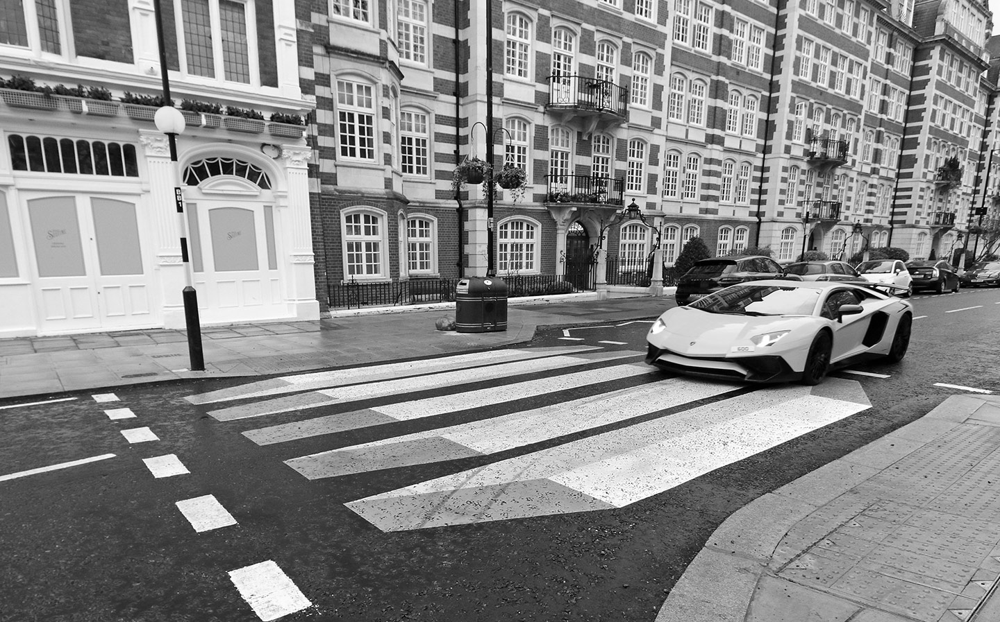

In [4]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

Ponieważ konwersja jest wykonywana metodą bardziej odpowiednią dla ludzkiego oka - modelu YUV. Ludzkie oko jest bardziej wyczulone na kolor zielony, a najmniej na kolor niebieski.

## c) Proszę rozdzielić składowe RGB obrazu i wyświetlić trzy obrazy w skali szarości odpowiadające intensywności pierwotnego obrazu osobno w składowych R, G i B.

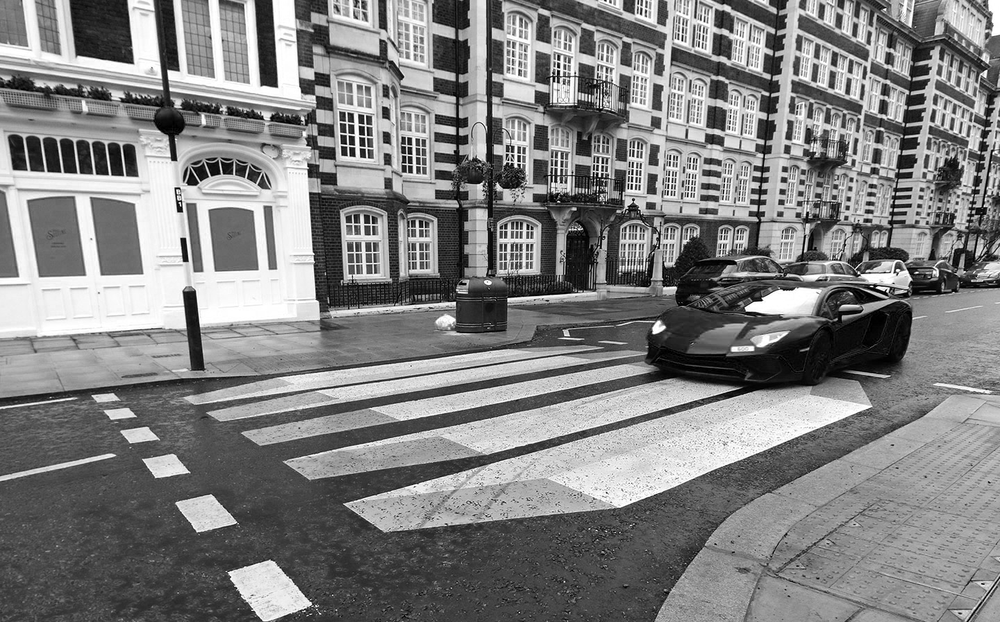

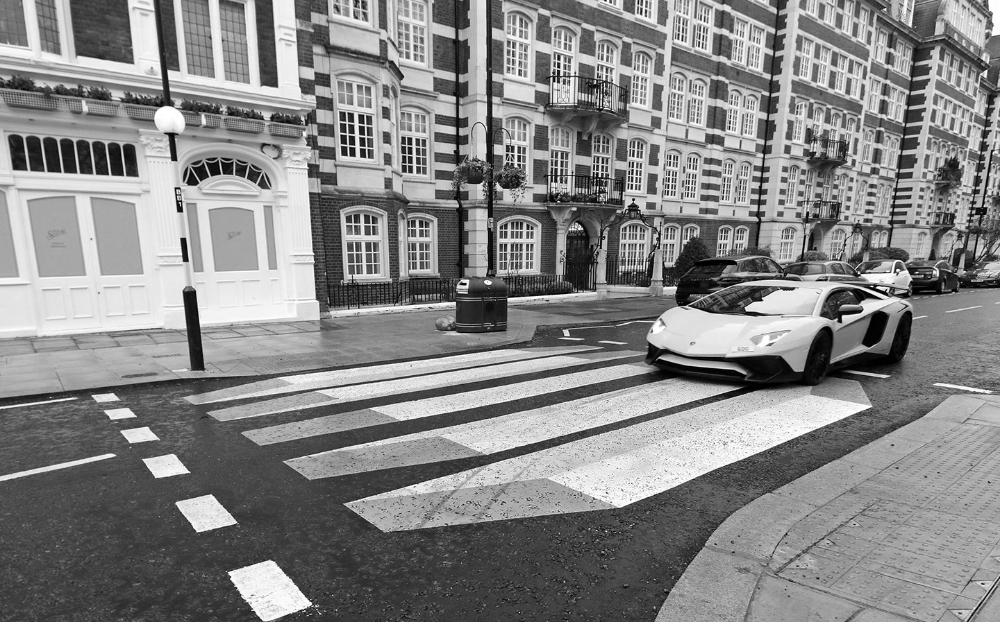

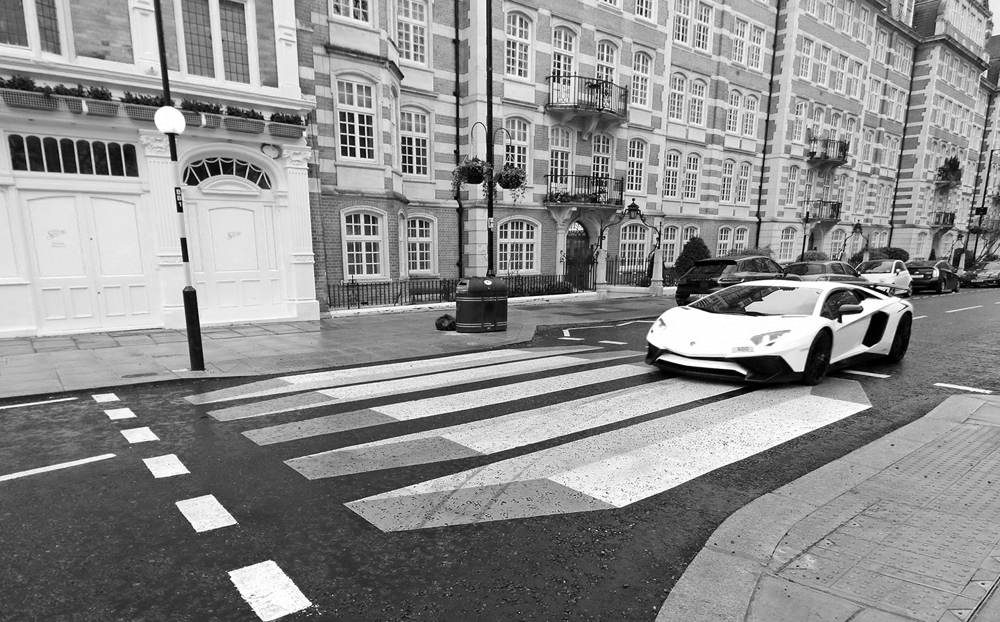

In [5]:
b,g,r = cv2.split(image)

cv2_imshow(b)

cv2_imshow(g)

cv2_imshow(r)

## d) Dokonaj konwersji obrazu do skali HSV i wyświetl trzy obrazy w skali szarości odpowiadające intensywności pierwotnego obrazu osobno w składowych H, S i V.

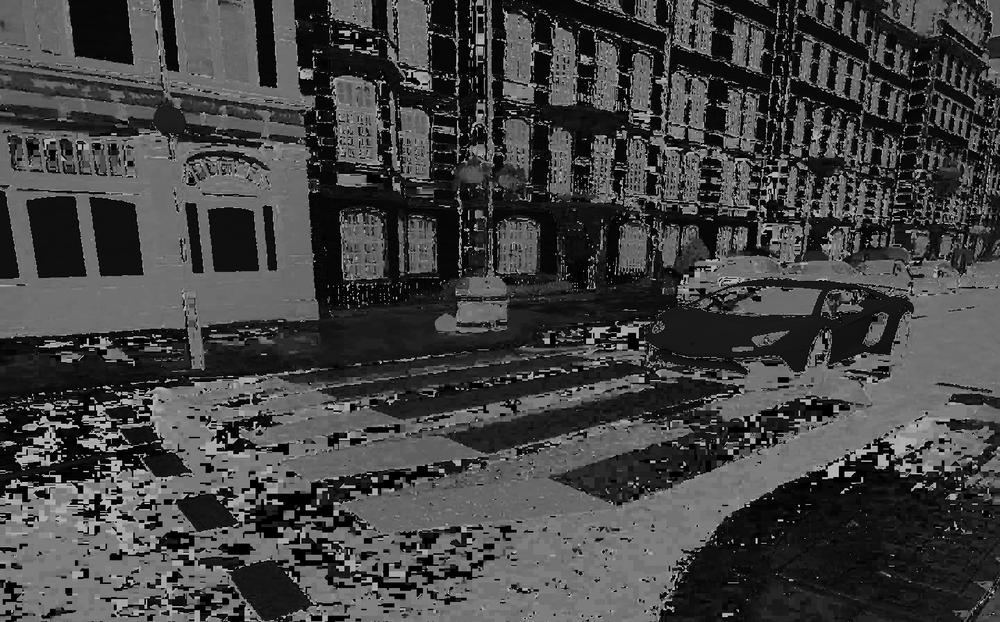

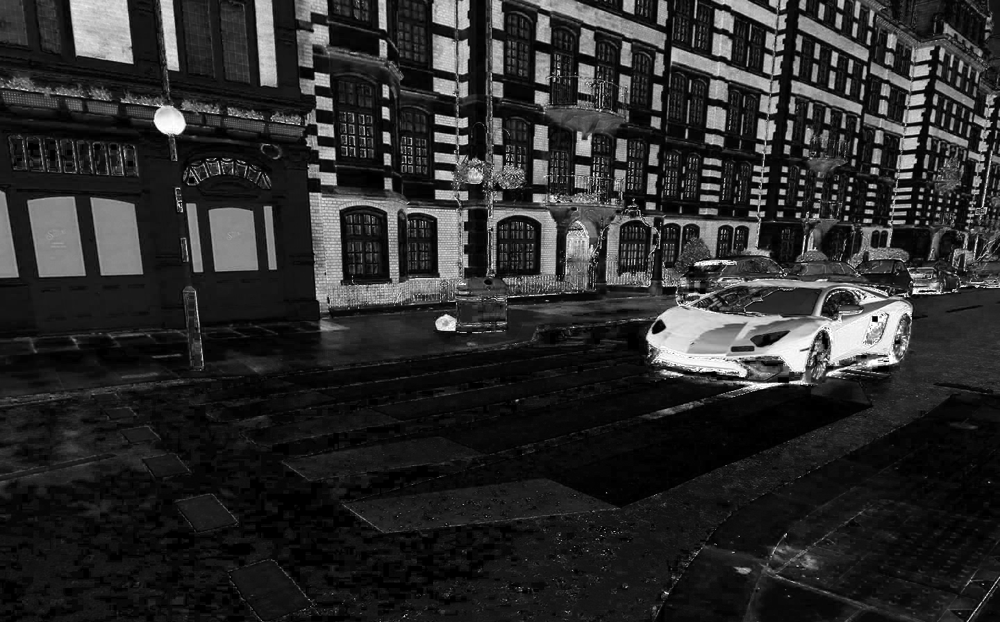

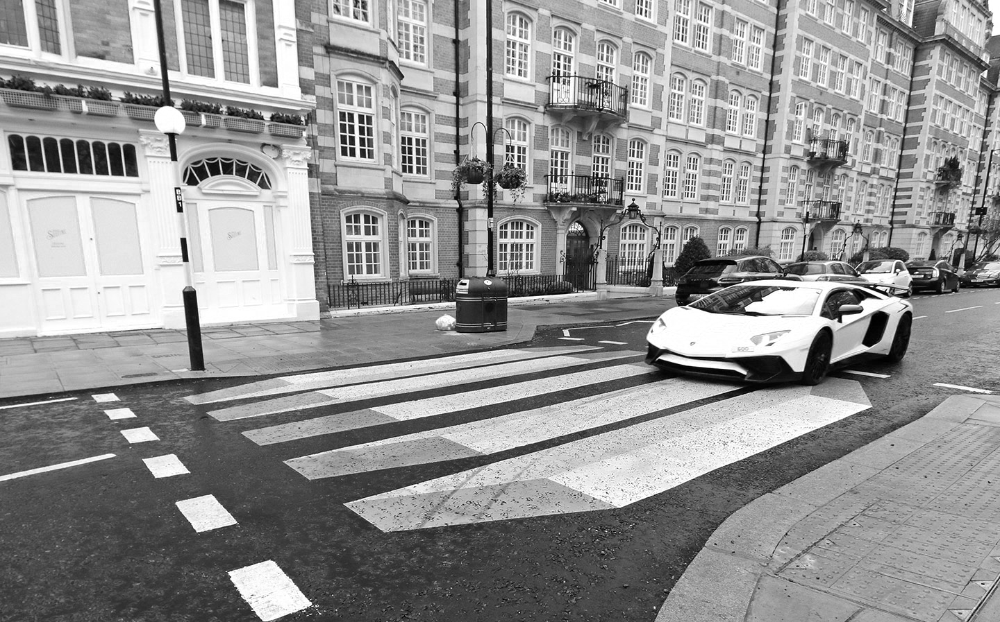

In [6]:
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

h, s, v = cv2.split(hsv)

cv2_imshow(h)

cv2_imshow(s)

cv2_imshow(v)

## e) Stwórz obraz na którym widoczny będzie jedynie żółty samochód - to cenne ćwiczenie w zagadnieniach śledzenia obiektów. Realizujemy to w skali HSV- dlaczego?

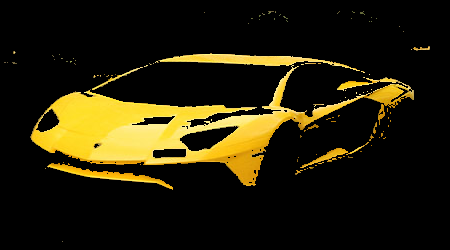

In [7]:
mask = cv2.inRange(hsv, (20,100,100), (36, 255, 255))
target = cv2.bitwise_and(image,image, mask=mask)

cv2_imshow(target[350:600,900:1350])

Realizujemy ćwiczenie w modelu HSV, ponieważ można łatwo wyodrębnić kolor żółty. Jak możemy zauważyć na drugim i trzecim kanale modelu HSV, samochód jest obiektem mocno wyróżniającym się z powodu tego, że jest on koloru żółtego. Poza tym, skala HSV jest lepiej widziana przez ludzkie oko niż RGB.

## f) Proszę narysować histogram obrazu dla trzech składowych R,G,B

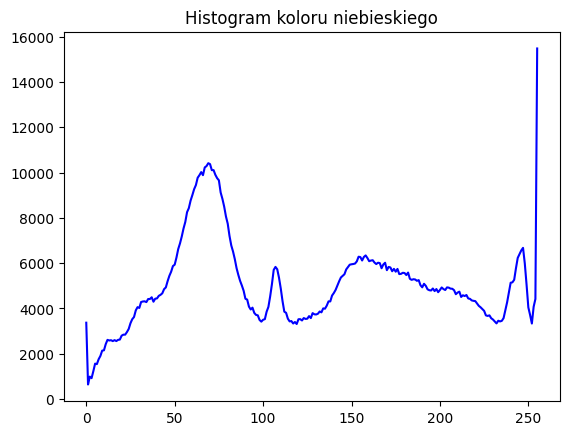

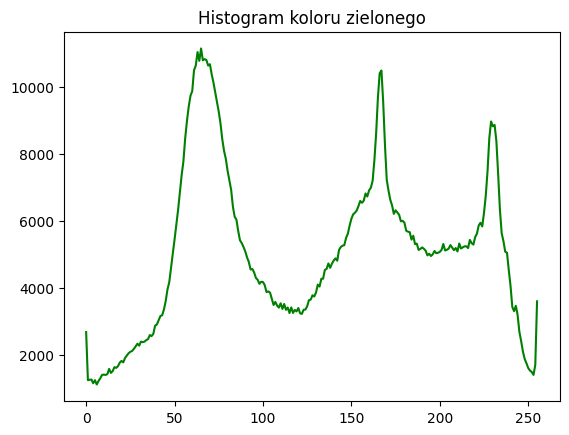

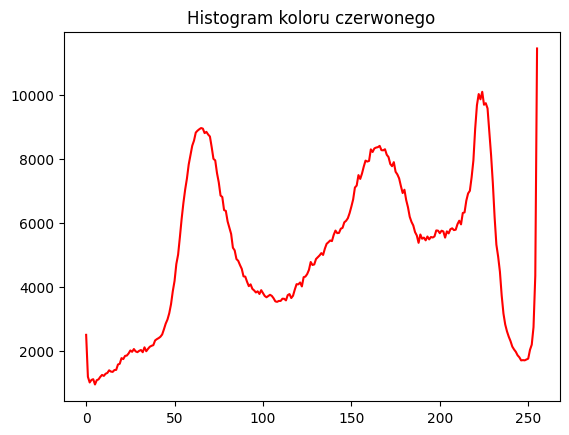

In [8]:
import numpy as np
from matplotlib import pyplot as plt
hist_b = cv2.calcHist([image],[0],None,[256],[0,256])
hist_g = cv2.calcHist([image],[1],None,[256],[0,256])
hist_r = cv2.calcHist([image],[2],None,[256],[0,256])

plt.plot(hist_b, color='b')
plt.title('Histogram koloru niebieskiego')
plt.show()
plt.plot(hist_g, color='g')
plt.title('Histogram koloru zielonego')
plt.show()
plt.plot(hist_r, color='r')
plt.title('Histogram koloru czerwonego')
plt.show()

## g) Proszę zrealizować rozciąganie kontrastu i wyrównanie histogramu – dla obrazu zapisanego w skali szarości. Czym różni się wynik tych dwóch operacji?

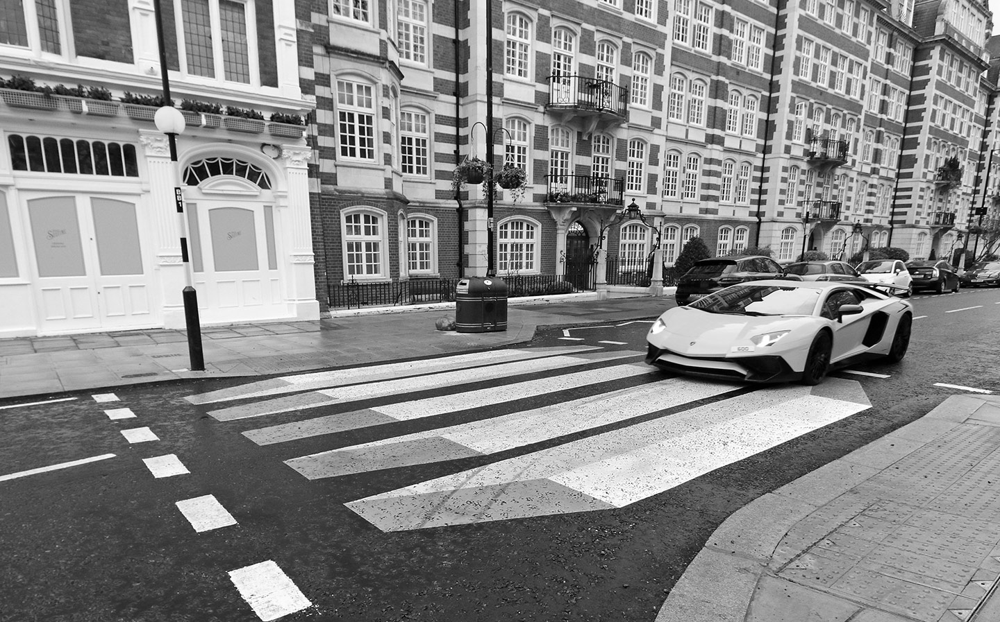

In [9]:
con_strech = gray.copy()
min = np.min(con_strech)
max = np.max(con_strech)
for pixel in con_strech:
  pixel = ((pixel-min)/(max-min))*255
cv2_imshow(con_strech)

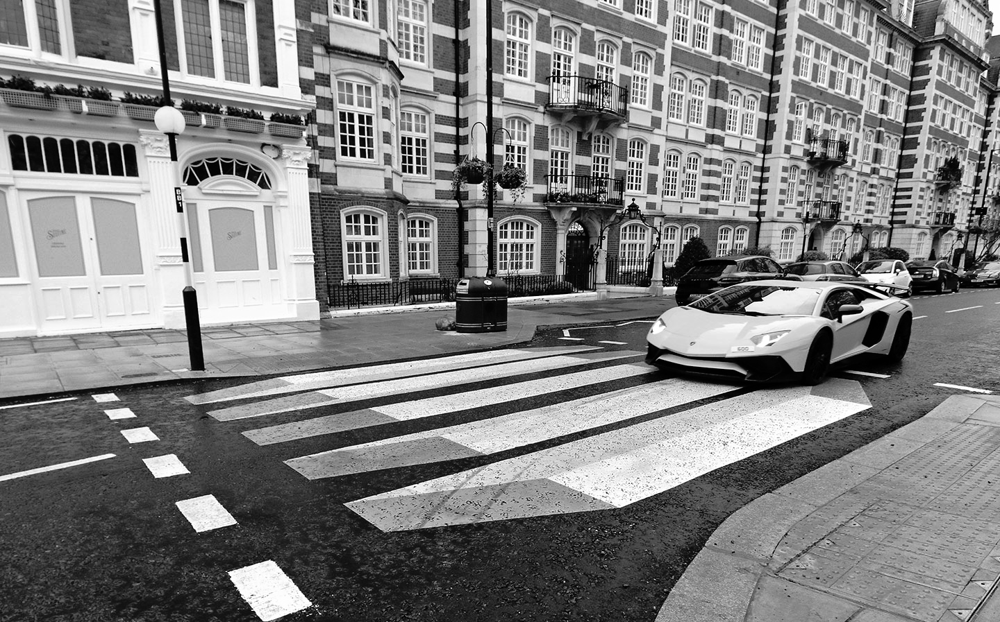

In [10]:
cv2_imshow(cv2.equalizeHist(gray))

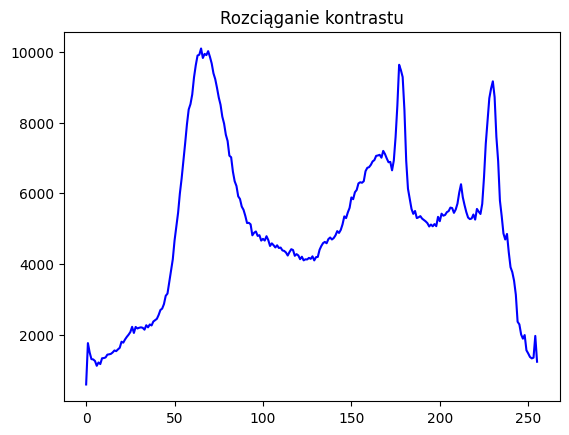

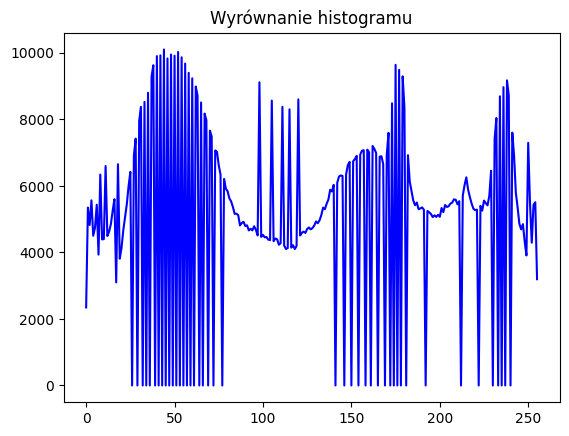

In [11]:
hist_rk = cv2.calcHist([con_strech],[0],None,[256],[0,256])

plt.plot(hist_rk, color='b')
plt.title('Rozciąganie kontrastu')
plt.show()

hist_eh = cv2.calcHist([cv2.equalizeHist(gray)],[0],None,[256],[0,256])

plt.plot(hist_eh, color='b')
plt.title('Wyrównanie histogramu')
plt.show()

Wyrównanie histogramu to metoda polegająca na poprawianiu kontrastu analizowanego obrazu z wykorzystaniem jego histogramu. Z jej pomocą wyrównywane są wzniesienia oraz wgłębienia na histogramie akumulacyjnym tworząc obraz, który korzysta bardziej równomiernie ze wszystkich z kolorów. 

Rozciąganie kontrastu polega zaś na proporcjonalnym zwiększeniu kontrastu dla
wszystkich występujących jasności, od minimalnej do maksymalnej, czyli od
najciemniejszej do najjaśniejszej. Rozrzesza po prostu przedział kolorów obrazu tak aby korzystał on z najjaśniejszego oraz najciemniejszego.

W przypadku tego obrazu przy operacji rozciągania kontrastu nie zobaczymy różnicy, ponieważ obraz korzysta już ze maksymalnej oraz minimalnej wartości z przedziału <0, 255>.

Wynik tych dwóch operacji różni się tym, że część wartości na hstogramie rozciągniecia została wyzerowana, a wzniesienia na nim się rozszerzyły. Natomiast w przypadku rozciągania kontrastu nie zaszły żadne zmiany.